In [92]:
import pandas as pd
import torch
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

from sklearn.preprocessing import MinMaxScaler
import statistics as stat

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
from google.colab import drive
drive.mount('/content/drive')
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# FineTuning ranking

model design

In [93]:
def predictionsPlot(predTS, start,end,name):
    # Ensure start and end are integers
    start = int(start)
    end = int(end)

    y_true_flat = np.array(predTS["targets"])
    y_pred_flat = np.array(predTS["predictions"])
    plt.figure(figsize=(55, 25))
    if start == -1 and end == -1:
        plt.plot(y_true_flat[:-1], label='True Value')
        plt.plot(y_pred_flat[:-1], label=name)
    else:
        plt.plot(y_true_flat[start:end], label='True Value')
        plt.plot(y_pred_flat[start:end], label=name)
        adjusted_start = start - (start % 24)
        for i in range(adjusted_start, end, 24):
            if i >= start:
                plt.axvline(x=i-start, color='k', linestyle='--')
    plt.title('Results')
    plt.xlabel('Time Step')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

In [110]:
def predictionsPlotVS(predTS1,predTS2,name1,name2,start,end):
    y_true_flat1 = np.array(predTS1["targets"])
    y_pred_flat1 = np.array(predTS1["predictions"])
    y_pred_flat2 = np.array(predTS2["predictions"])
    y_true_flat2 = np.array(predTS2["targets"])

    plt.figure(figsize=(55, 25))
    if start == -1 and end == -1:
        plt.plot(y_true_flat1[:-1], label=f'True Value{name1}')
        plt.plot(y_pred_flat1[:-1], label=f"predict{name1}")
        plt.plot(y_true_flat2[:-1], label=f"True Value{name2}")
        plt.plot(y_pred_flat2[:-1], label=f"predict{name2}")

    else:
        plt.plot(y_true_flat1[:-1], label=f'True Value{name1}')
        plt.plot(y_pred_flat1[:-1], label=f"predict{name1}")
        plt.plot(y_true_flat2[:-1], label=f"True Value{name2}")
        plt.plot(y_pred_flat2[:-1], label=f"predict{name2}")

        # Ensure the loop starts at the right index for vertical lines
        adjusted_start = start - (start % 24)

        for i in range(adjusted_start, end, 24):
            if i >= start:
                plt.axvline(x=i-start, color='k', linestyle='--')  # Adjust x to align with sliced data plot
    plt.title('Results')
    plt.xlabel('Time Step')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

In [95]:
class CNNLSTMModel(nn.Module):

  def __init__(self, input_size, num_lstm_layers, dropout,
               sequence_length,nStepsAhead):
    super().__init__()

    # model definition
    self.hybridNetwork = nn.Sequential(
        nn.Conv1d(in_channels=input_size,
                  out_channels=sequence_length,
                  kernel_size=1),
        nn.ReLU(),
        nn.LSTM(input_size=sequence_length,
                hidden_size=sequence_length,
                num_layers=num_lstm_layers,
                dropout=dropout,
                batch_first=False),
    )
    self.endLinearLayer = nn.Linear(sequence_length,nStepsAhead)

  def forward(self, x):
    # Apply CNN layers
    x = x.permute(0, 2, 1)
    x = self.hybridNetwork[0](x)  # Conv1d
    x = self.hybridNetwork[1](x)  # ELU activation

    # Permute the dimensions for LSTM
    x = x.permute(2, 0, 1)

    # Apply LSTM layers
    x, (hidden, cell) = self.hybridNetwork[2](x)

    # Only take the output from the last time-step
    x = x[-1, :, :]

    # Apply final linear layer
    x = self.endLinearLayer(x)
    return x




# 1. youthfulSweep4Model



```
CNNLSTMModel(
 83   (hybridNetwork): Sequential(
 84     (0): Conv1d(61, 176, kernel_size=(1,), stride=(1,))
 85     (1): ReLU()
 86     (2): LSTM(176, 176, num_layers=3, dropout=0.5255918882358939)
 87   )
 88   (endLinearLayer): Linear(in_features=176, out_features=24, bias=True)
 89 )
```



In [96]:
KPITSyou4 = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/ResultOutput/RWIN_CNNLSTM1/LC2_prediction[tr&vlW-24h-noOPT]/OPTRWIN_CNNLSTM (LC2[tr&vlW-24h-noOPT])/youthful-sweep4KPI.csv")
predTSyou4 = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/ResultOutput/RWIN_CNNLSTM1/LC2_prediction[tr&vlW-24h-noOPT]/OPTRWIN_CNNLSTM (LC2[tr&vlW-24h-noOPT])/youthful-sweep4predictions_t2cs7uv6.csv")


config = {
    "alphaRMS": 0.8878535830123158,
    "batch_size": 128,
    "device": "cuda",
    "dimTrValDataSet": 0.8135103108199945,
    "dropout": 0.5255918882358939,
    "eps": 0.00000001809781643808,
    "input_size": 61,
    "l1_factor": 0.00001788764196672363,
    "l1_lambda": 0.00985428675707348,
    "learning_rateAdam": 0.000654610999498754,
    "learning_rateRMS": 0.04441832592851753,
    "method": "random",
    "metric": {
        "goal": "minimize",
        "name": "avg_TestLoss",
        "min_delta": 0.0035540167852985117
    },
    "momentumRMS": 0.726408866481537,
    "nStepsAhead": 24,
    "num_epochs": 633,
    "num_lstm_layers": 3,
    "optimizer": "Adam",
    "patience": 38,
    "scheduler": "ReduceLROnPlateau",
    "scheduler_factor": {
        "CosineAnnealingWarmRestarts": 1.1189226291910723,
        "ReduceLROnPlateau": 0.7502387107470798
    },
    "scheduler_min_lr": {
        "CosineAnnealingWarmRestarts": 0.0000986804709547241,
        "ReduceLROnPlateau": 0.00025800234809786196
    },
    "scheduler_patience": {
        "CosineAnnealingWarmRestarts": 5.485778505433907,
        "ReduceLROnPlateau": 8.645318720669717
    },
    "test_split_size": 0.14632058556123811,
    "trW": 20,
    "vlWl": 17,
    "weight_decay": {
        "Adam": 0.0008131241983869834,
        "RMS": 0.004928825586952906
    },
    "window_size": 176
}

youthfu4lModel = CNNLSTMModel(config["input_size"],config["num_lstm_layers"], config["dropout"],config["window_size"],config["nStepsAhead"])
model_path = '/content/drive/MyDrive/Colab Notebooks/ResultOutput/RWIN_CNNLSTM1/LC2_prediction[tr&vlW-24h-noOPT]/OPTRWIN_CNNLSTM (LC2[tr&vlW-24h-noOPT])/youthful-sweep4OPTRWIN_CNNLSTM (LC2[tr&vlW-24h-noOPT]t2cs7uv6.pth'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
youthfu4lModel.load_state_dict(torch.load(model_path, map_location=device))
youthfu4lModel = youthfu4lModel.to(device)
youthfu4lModel.eval()
KPITSyou4.head()

,Unnamed: 0,MSE,RMSE,R2,ACCURACY,MAE,AV-AE,Explane variance,ACPER2,ACPER5,APE,Dataset
0,0,0.000921,0.030349,0.986741,-58.211612,0.023657,0.019507,0.986741,11.493056,27.994792,0.379548,Training
1,1,0.000599,0.024475,0.991098,73.132917,0.020042,0.017630,0.991101,11.341146,26.848958,-0.049145,Validation
2,2,0.000187,0.013658,0.983748,96.557466,0.010854,0.009141,0.983817,41.009852,85.283251,-0.001806,Test


In [97]:
predTSyou4.head()

,targets,predictions
0,0.211612,0.203979
1,0.211408,0.203916
2,0.210893,0.204011
3,0.210970,0.203956
4,0.211192,0.204017


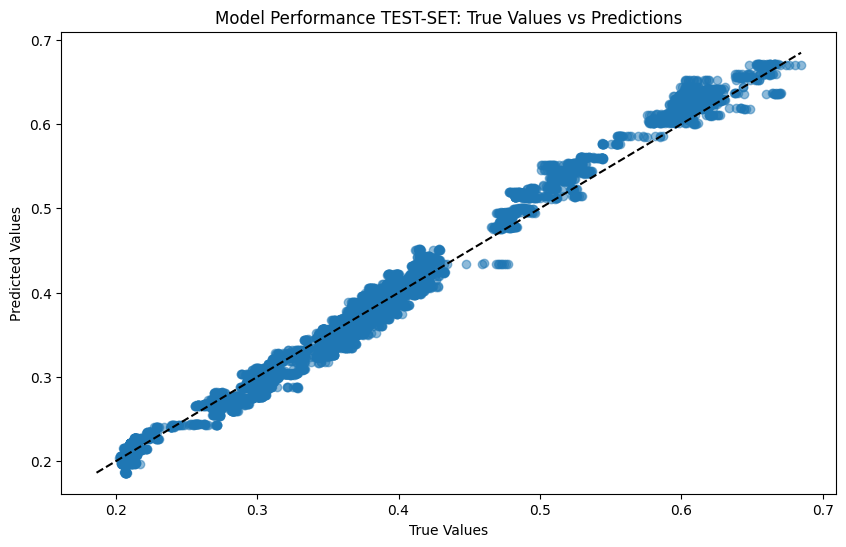

In [98]:
y_true_flat = np.array(predTSyou4["targets"])
y_pred_flat = np.array(predTSyou4["predictions"])

    # Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(y_true_flat, y_pred_flat, alpha=0.5)
plt.title('Model Performance TEST-SET: True Values vs Predictions')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')

    # Plot the perfect prediction line
max_val = max(y_true_flat.max(), y_pred_flat.max())
min_val = min(y_true_flat.min(), y_pred_flat.min())
plt.plot([min_val, max_val], [min_val, max_val], 'k--')

plt.show()

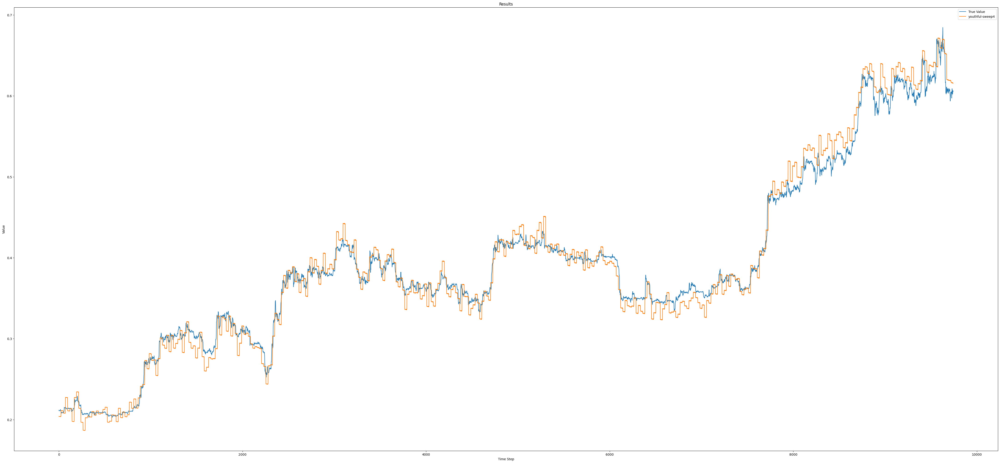

In [99]:
predictionsPlot(predTSyou4,-1,-1,"youthful-sweep4")

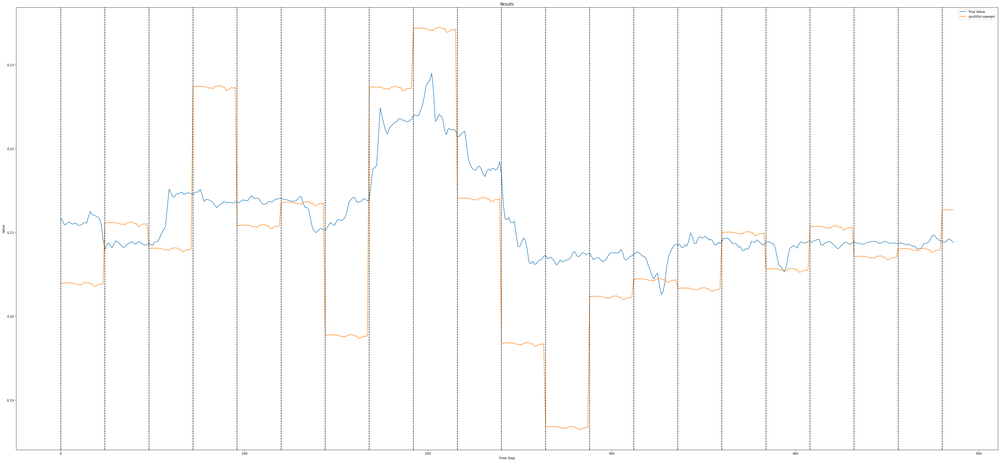

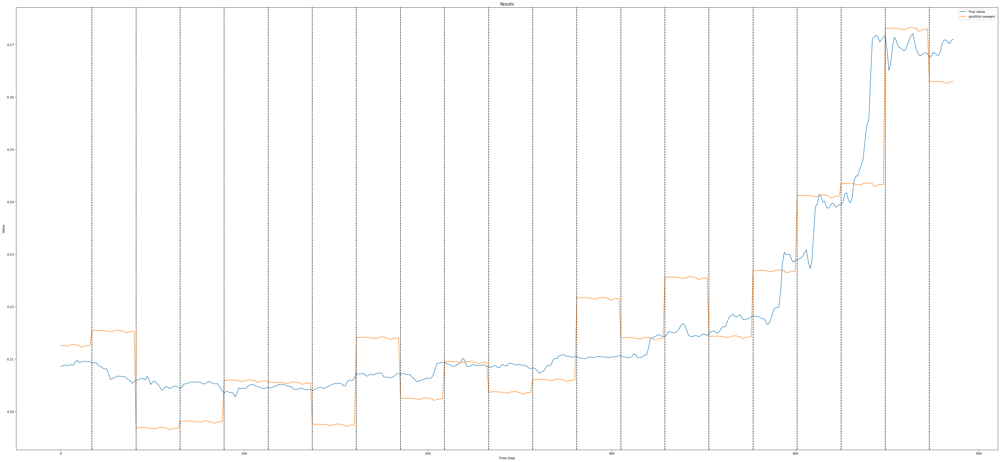

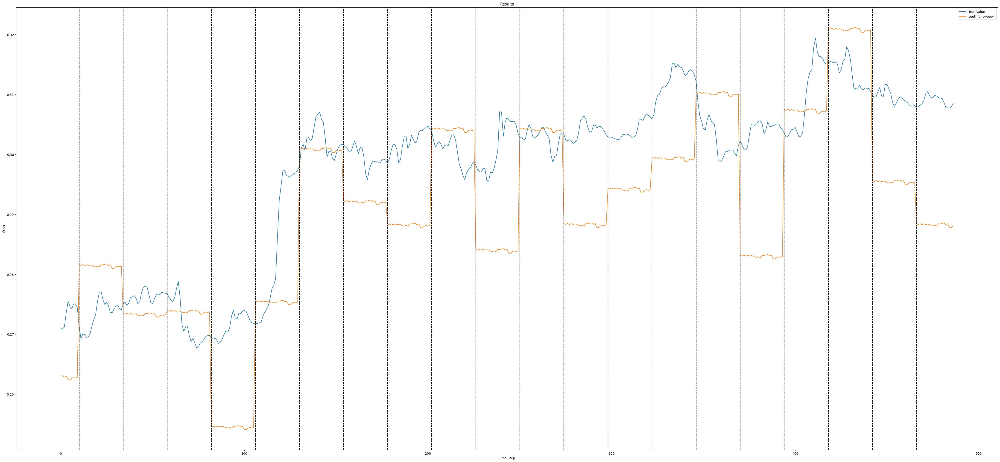

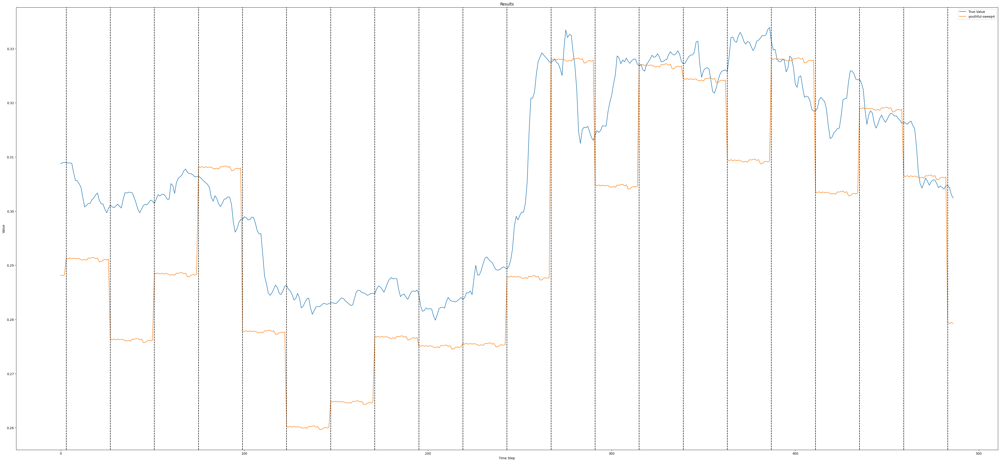

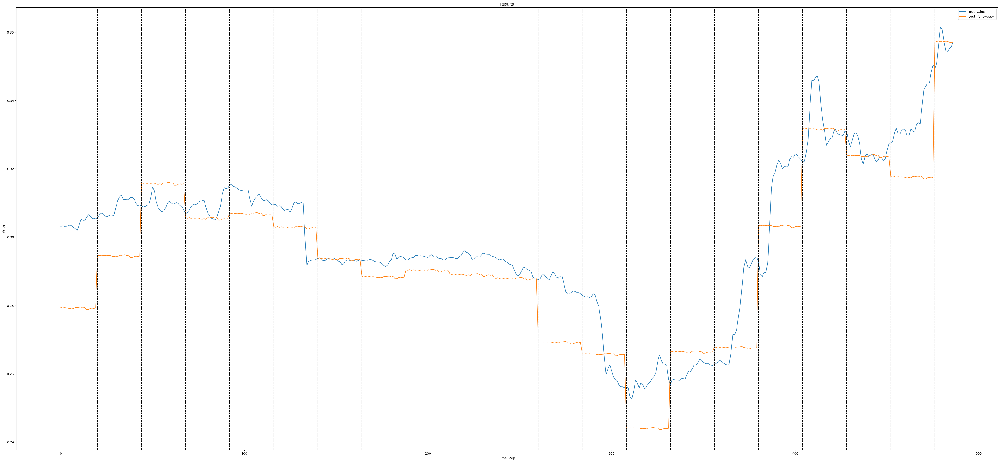

...

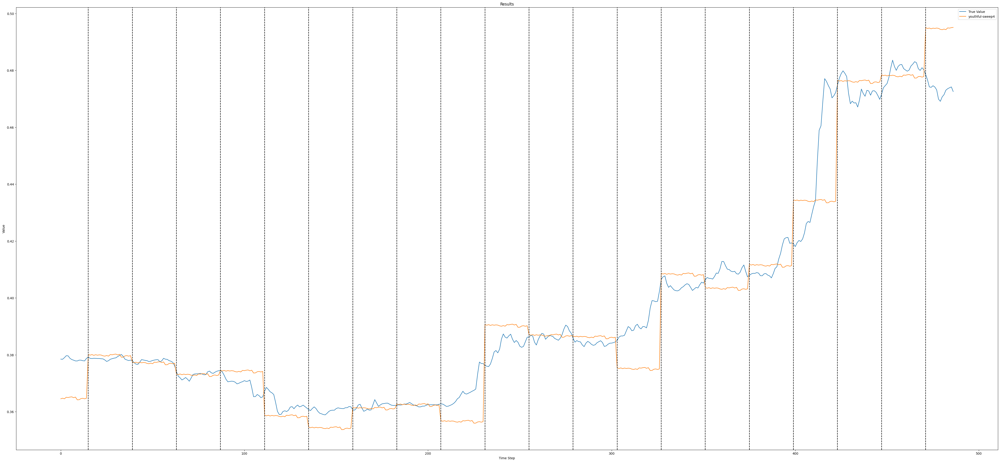

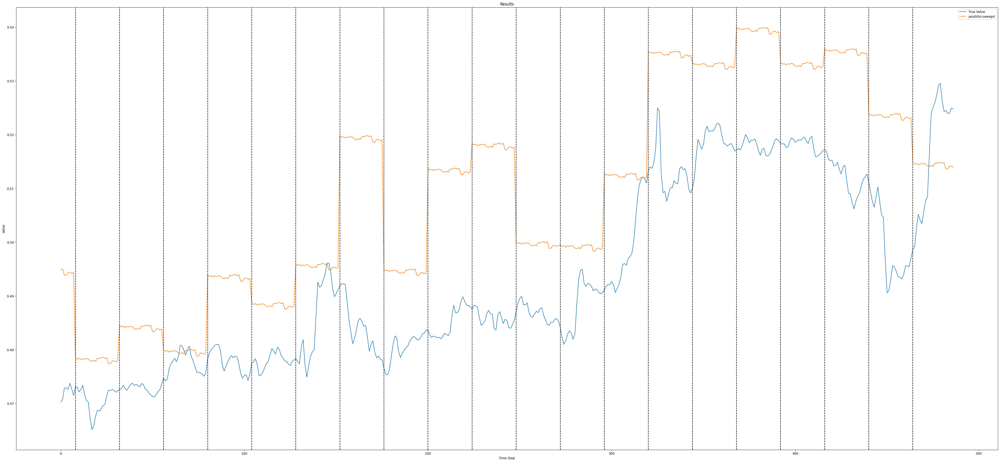

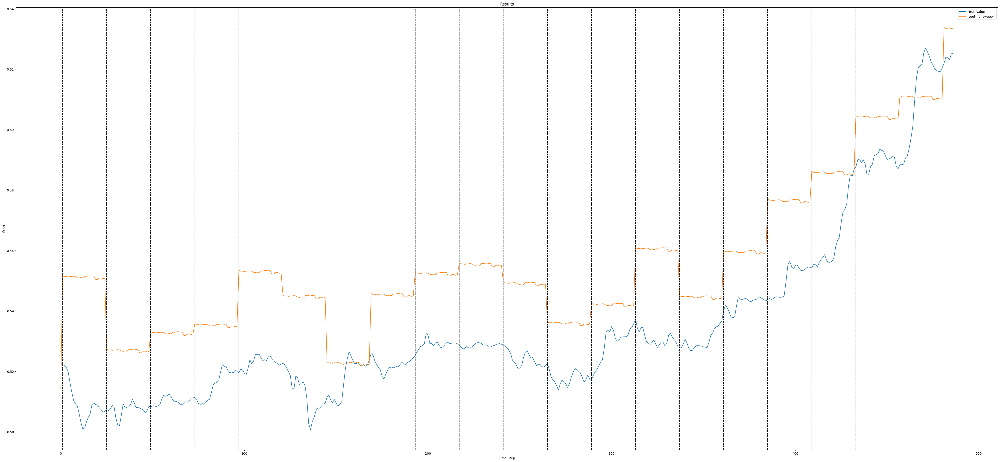

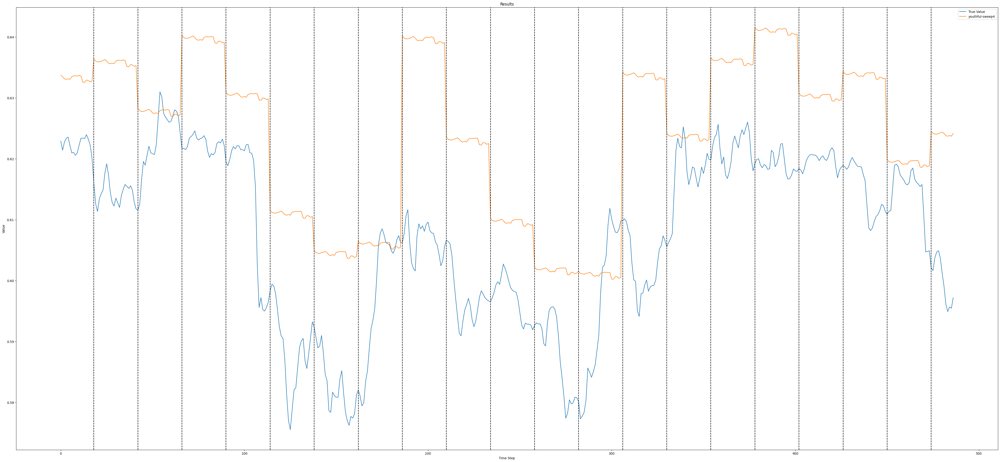

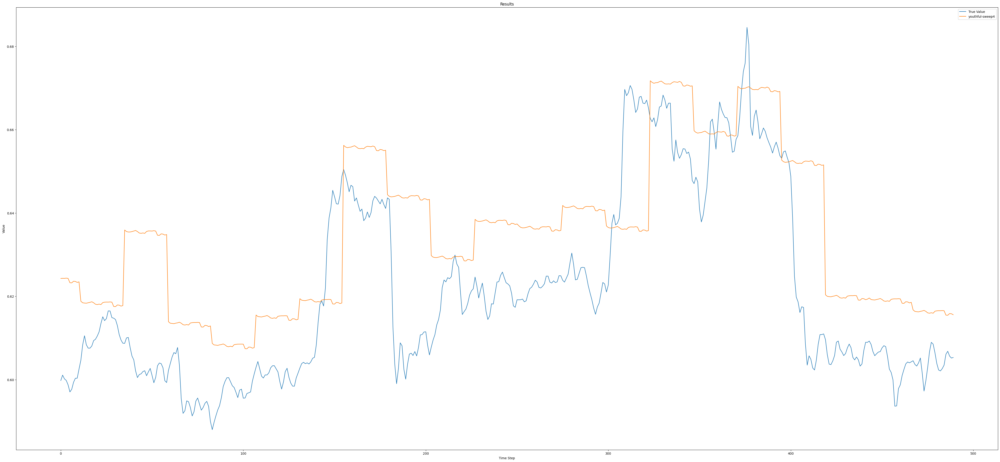

In [100]:
total_steps = len(predTSyou4['targets'])
segment_length = total_steps // 20
for segment in range(20):
    start = segment * segment_length
    if segment < 19:
        end = (segment + 1) * segment_length
    else:
        end = -1  # Ensure we capture the last segment completely in case it doesn't divide evenly
    predictionsPlot(predTSyou4, start, end,"youthful-sweep4")

#2. youthfulSweep1Model


si chiama youthfulSweep1 (coreggi)
```
CNNLSTMModel(
 85   (hybridNetwork): Sequential(
 86     (0): Conv1d(61, 107, kernel_size=(1,), stride=(1,))
 87     (1): ReLU()
 88     (2): LSTM(107, 107, num_layers=2, dropout=0.47729819441564975)
 89   )
 90   (endLinearLayer): Linear(in_features=107, out_features=24, bias=True)
 91 )
```



In [101]:
KPITSyou2 = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/ResultOutput/RWIN_CNNLSTM1/LC2_prediction[tr&vlW-24h-noOPT]/OPTRWIN_CNNLSTM (LC2[tr&vlW-24h-noOPT])/youthful-sweep-2KPI.csv")
predTSyou2 = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/ResultOutput/RWIN_CNNLSTM1/LC2_prediction[tr&vlW-24h-noOPT]/OPTRWIN_CNNLSTM (LC2[tr&vlW-24h-noOPT])/youthful-sweep-2best_predictions.csv")

config = ({
    "alphaRMS": 0.8090629456939943,
    "batch_size": 256,
    "device": "cuda",
    "dimTrValDataSet": 0.8287586984440504,
    "dropout": 0.47729819441564975,
    "eps": 0.00000001239315541506,
    "input_size": 61,
    "l1_factor": 0.00000801726287205171,
    "l1_lambda": 0.008624243414141938,
    "learning_rateAdam": 0.00047672560850465183,
    "learning_rateRMS": 0.03200644582058168,
    "method": "random",
    "min_delta": 0.006096607563388158,
    "momentumRMS": 0.963606595029008,
    "nStepsAhead": 24,
    "num_epochs": 751,
    "num_lstm_layers": 2,
    "optimizer": "Adam",
    "patience": 75,
    "scheduler": "CosineAnnealingWarmRestarts",
    "scheduler_factorCosineAnnealingWarmRestarts": 1.4322512566039018,
    "scheduler_factorReduceLROnPlateau": 0.3594300317882112,
    "scheduler_min_lrCosineAnnealingWarmRestarts": 0.00006547923293479863,
    "scheduler_min_lrReduceLROnPlateau": 0.0004098525090052048,
    "scheduler_patience": 18,
    "scheduler_patienceCosineAnnealingWarmRestarts": 4.026656767962747,
    "scheduler_patienceReduceLROnPlateau": 8.324588475863347,
    "test_split_size": 0.18050278863998653,
    "trW": 16,
    "vlWl": 5,
    "weight_decayAdam": 0.0009572119939357342,
    "weight_decayRMS": 0.0006475907082396568,
    "window_size": 107,
    "input_size": 61

})

youthfu2lModel = CNNLSTMModel(config["input_size"],config["num_lstm_layers"], config["dropout"],config["window_size"],config["nStepsAhead"])
model_path = '/content/drive/MyDrive/Colab Notebooks/ResultOutput/RWIN_CNNLSTM1/LC2_prediction[tr&vlW-24h-noOPT]/OPTRWIN_CNNLSTM (LC2[tr&vlW-24h-noOPT])/youthful-sweep-2best_predictionsOPTRWIN_CNNLSTM (LC2[tr&vlW-24h-noOPT]dljui583.pth'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
youthfu2lModel.load_state_dict(torch.load(model_path, map_location=device))
youthfu2lModel = youthfu2lModel.to(device)
youthfu2lModel.eval()
KPITSyou2.head()

,Unnamed: 0,MSE,RMSE,R2,ACCURACY,MAE,AV-AE,Explane variance,ACPER2,ACPER5,APE,Dataset
0,0,0.001998,0.044700,0.970362,-inf,0.032958,0.024378,0.970374,7.294695,19.022529,inf,Training
1,1,0.001485,0.038538,0.977577,70.129851,0.029107,0.023148,0.977613,8.039608,21.635780,-0.047646,Validation
2,2,0.000440,0.020977,0.953516,94.599183,0.018701,0.018570,0.989390,14.360517,53.954991,-0.046912,Test


In [102]:
predTSyou2.head()

,targets,predictions
0,0.210125,0.215568
1,0.210076,0.215565
2,0.210084,0.215579
3,0.210251,0.215586
4,0.210410,0.215550


# Scatter on TestSet

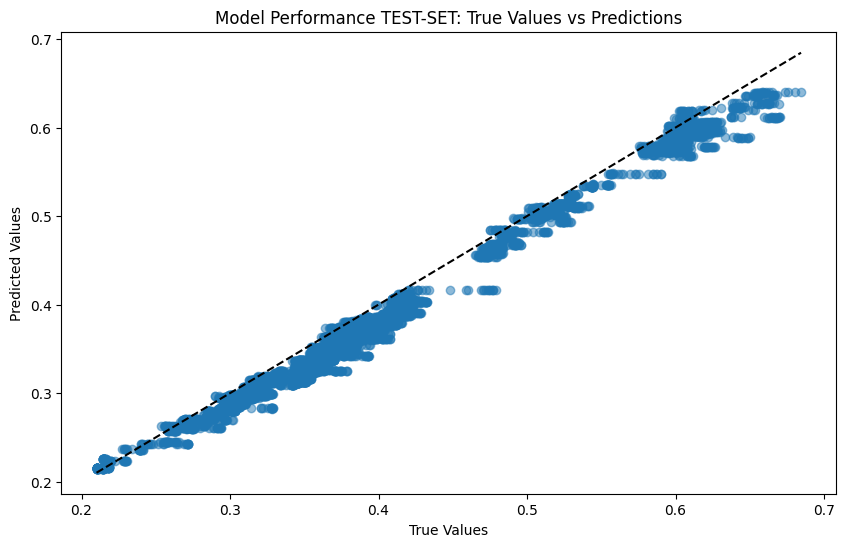

In [103]:

y_true_flat = np.array(predTSyou2["targets"])
y_pred_flat = np.array(predTSyou2["predictions"])

    # Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(y_true_flat, y_pred_flat, alpha=0.5)
plt.title('Model Performance TEST-SET: True Values vs Predictions')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')

    # Plot the perfect prediction line
max_val = max(y_true_flat.max(), y_pred_flat.max())
min_val = min(y_true_flat.min(), y_pred_flat.min())
plt.plot([min_val, max_val], [min_val, max_val], 'k--')

plt.show()

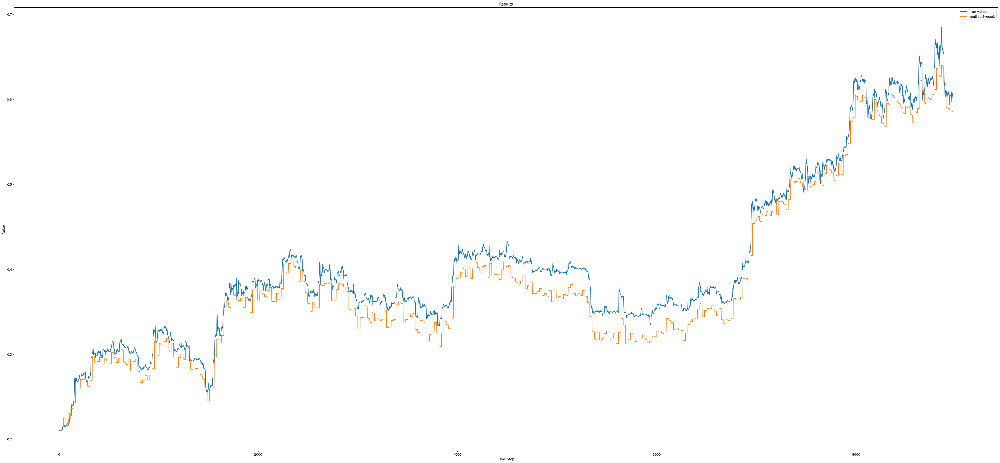

In [104]:
predictionsPlot(predTSyou2,-1,-1,"youthfulSweep2")

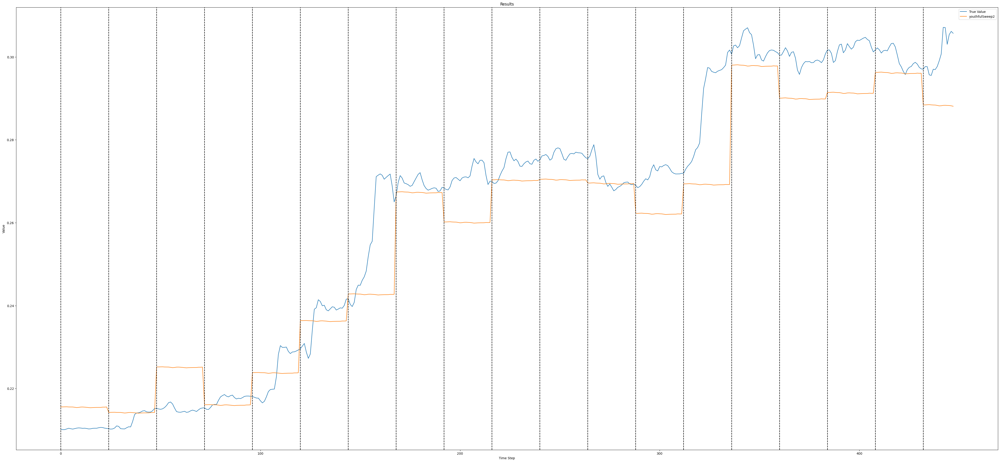

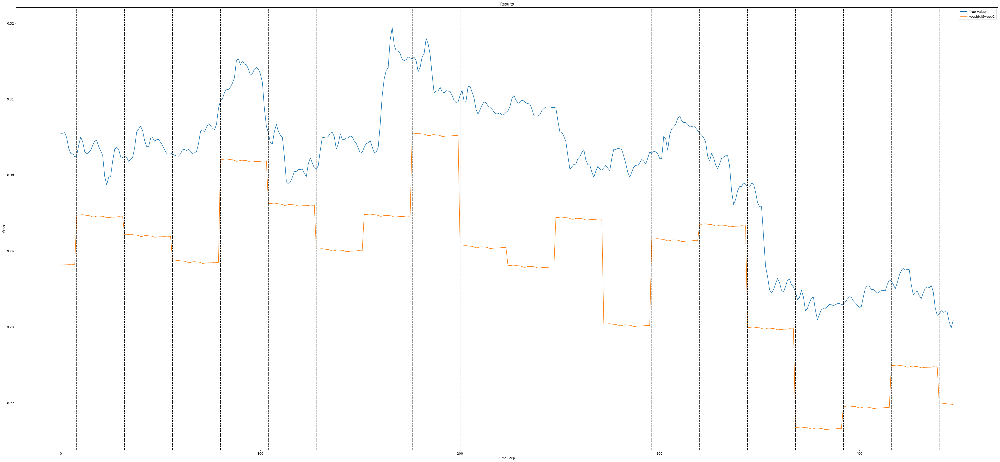

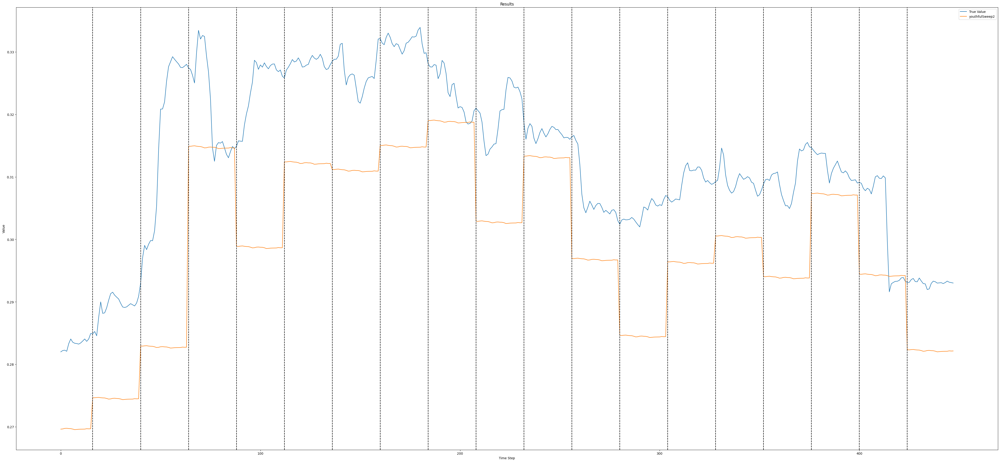

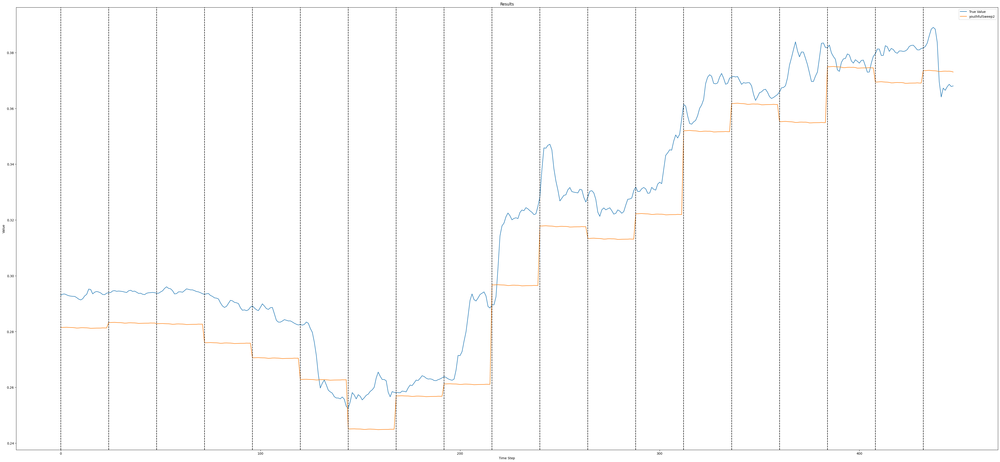

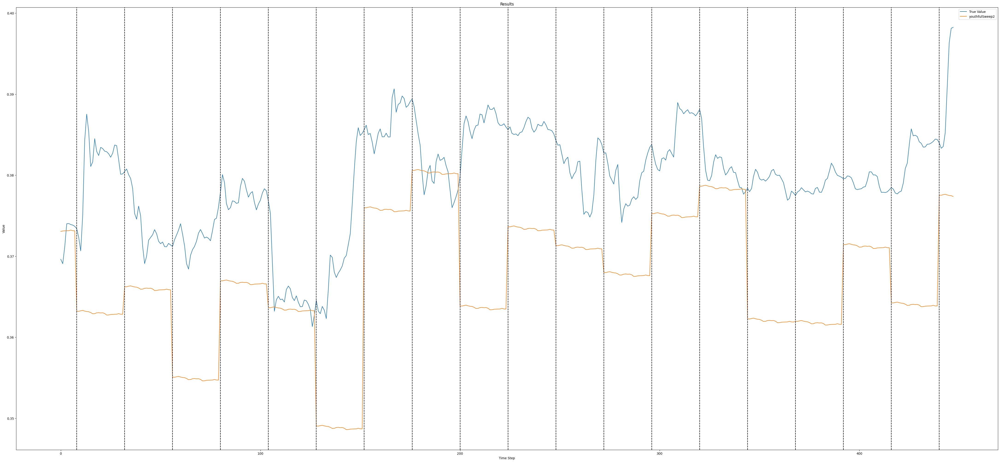

...

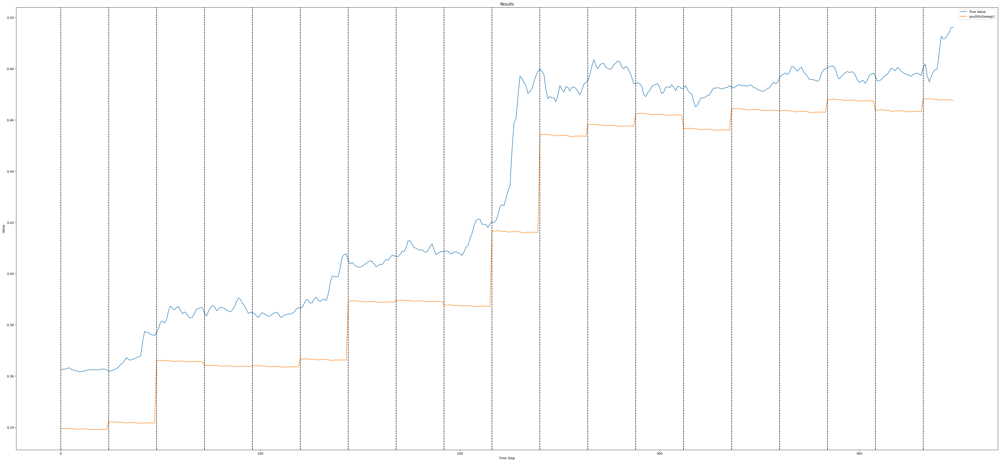

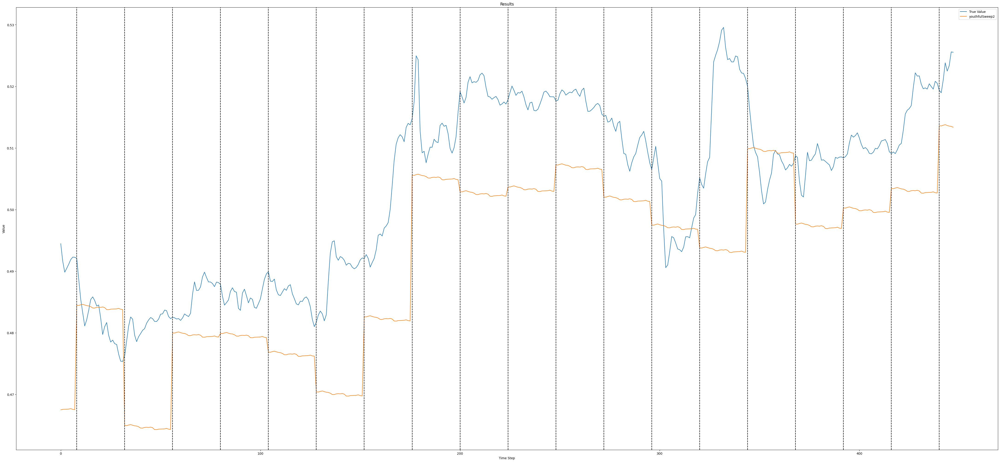

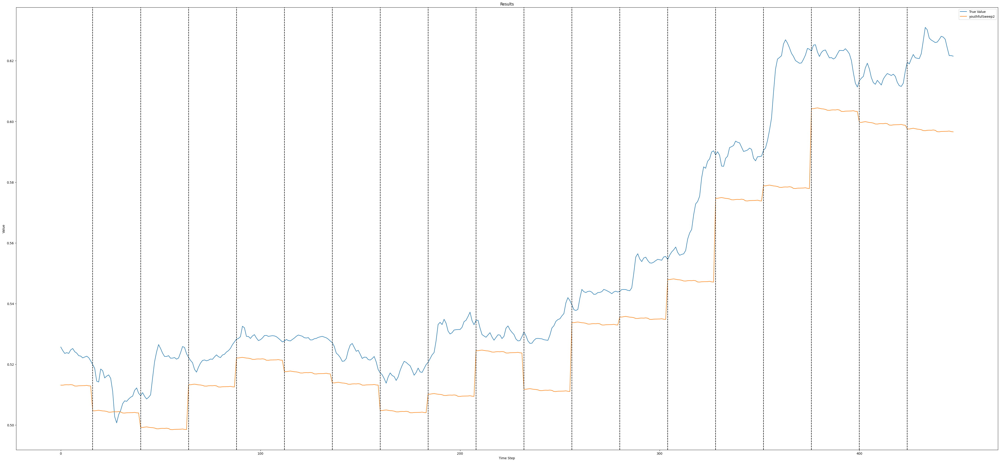

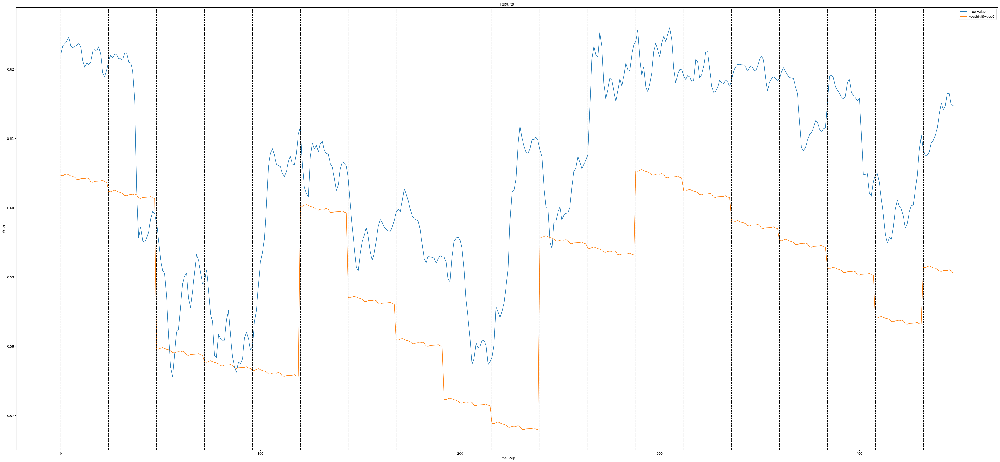

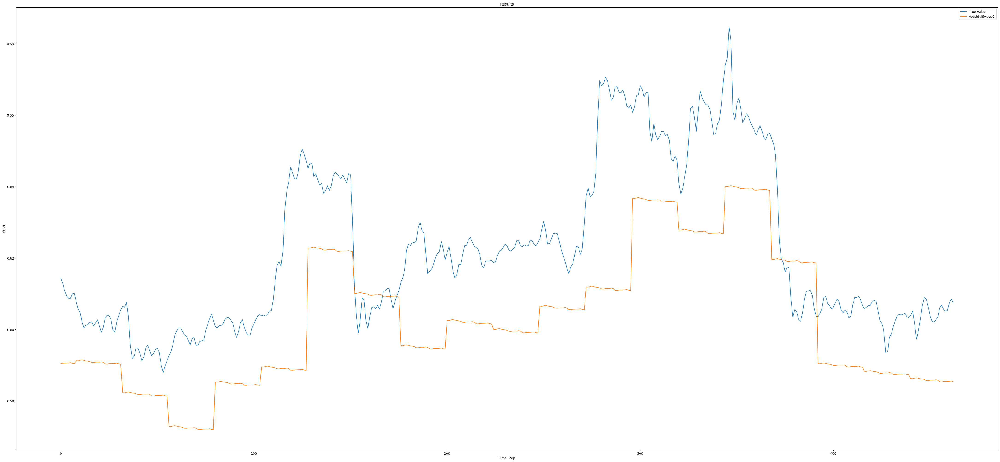

In [106]:
total_steps = len(predTSyou2['targets'])
segment_length = total_steps // 20
for segment in range(20):
    start = segment * segment_length
    if segment < 19:
        end = (segment + 1) * segment_length
    else:
        end = -1  # Ensure we capture the last segment completely in case it doesn't divide evenly
    predictionsPlot(predTSyou2, start, end,"youthfulSweep2")

In [107]:
KPITSyou2['ModelName'] = 'youthful-sweep2'
KPITSyou4['ModelName'] = 'youthful-sweep4'
KPIrank = pd.concat([KPITSyou2,KPITSyou4])
KPIrank.reset_index(drop=True, inplace=True)
KPIrank.drop(columns=['Unnamed: 0'], inplace=True)
# Rimuovi le colonne "ModelName" e "Dataset" dal DataFrame
model_name_col = KPIrank.pop('ModelName')
dataset_col = KPIrank.pop('Dataset')

# Inserisci le colonne "ModelName" e "Dataset" alle posizioni desiderate
KPIrank.insert(0, 'ModelName', model_name_col)
KPIrank.insert(1, 'Dataset', dataset_col)
KPIrank

,ModelName,Dataset,MSE,RMSE,R2,ACCURACY,MAE,AV-AE,Explane variance,ACPER2,ACPER5,APE
0,youthful-sweep2,Training,0.001998,0.044700,0.970362,-inf,0.032958,0.024378,0.970374,7.294695,19.022529,inf
1,youthful-sweep2,Validation,0.001485,0.038538,0.977577,70.129851,0.029107,0.023148,0.977613,8.039608,21.635780,-0.047646
2,youthful-sweep2,Test,0.000440,0.020977,0.953516,94.599183,0.018701,0.018570,0.989390,14.360517,53.954991,-0.046912
3,youthful-sweep4,Training,0.000921,0.030349,0.986741,-58.211612,0.023657,0.019507,0.986741,11.493056,27.994792,0.379548
4,youthful-sweep4,Validation,0.000599,0.024475,0.991098,73.132917,0.020042,0.017630,0.991101,11.341146,26.848958,-0.049145
5,youthful-sweep4,Test,0.000187,0.013658,0.983748,96.557466,0.010854,0.009141,0.983817,41.009852,85.283251,-0.001806


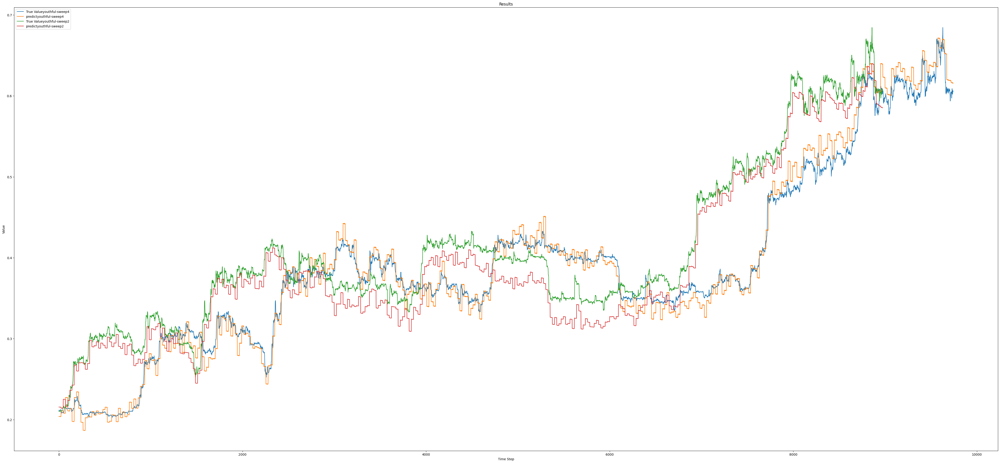

you4 dim:9744 and you2 dim:8976


In [111]:
predictionsPlotVS(predTSyou4,predTSyou2,"youthful-sweep4","youthful-sweep2",-1,-1)
print(f"you4 dim:{len(predTSyou4)} and you2 dim:{len(predTSyou2)}")